In [1]:
from libsvm.svmutil import *
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt
import math
from sklearn.metrics import confusion_matrix, classification_report
import pylab as pl
from time import time



In [2]:
data=pd.read_csv('feat_25.csv',header=None)

In [3]:
data.head(1)

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,3.443388,0.067421,-0.356799,-0.566246,-0.398694,-0.076224,0.362892,-0.128297,-1.052097,-0.446498,...,-0.634782,0.574091,-0.9876,1.437644,0.45699,0.729562,0.264465,0.521513,0.590843,0.0


In [4]:
data.shape

(3000, 26)

Binary classification

class1

In [5]:
image1 = data.iloc[0:300,:25]
labels1 = data.iloc[0:300,25:]
data1= pd.concat([image1,labels1],axis=1)


In [6]:
data1 = data1.reindex(np.random.permutation(data1.index))

In [7]:
data1

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
14,0.634959,-0.867022,-0.128952,-0.612001,-0.894567,-1.388319,-1.353207,-0.341843,-1.043528,-0.559225,...,-0.059996,0.772594,0.462587,1.084557,0.183482,-0.017882,1.578095,-0.321163,0.449276,0.0
224,0.690964,-0.009591,1.075839,1.252394,-2.325651,0.920998,0.838430,-0.663561,-0.552753,-0.980976,...,2.332513,0.293869,-1.696645,-0.359853,-0.876932,1.287256,1.257884,0.602298,-0.725232,0.0
93,1.606991,-0.317316,-0.193763,-0.516936,-1.841724,-0.131891,-0.392867,-0.383610,-0.938969,-0.827617,...,-1.197587,1.240178,-1.027709,0.095893,-0.246987,1.051816,0.643417,-0.608330,0.103629,0.0
39,2.919692,-0.999112,-0.208072,0.787646,-1.815046,-0.044905,0.778377,-1.637084,-1.039452,-1.573329,...,2.126630,-2.012767,0.940859,-0.215981,-0.072595,0.556942,-0.006873,0.371835,-1.215388,0.0
120,1.593624,-0.136353,1.201167,0.700211,-1.112252,0.638815,0.412628,-0.217204,-0.670873,1.237464,...,-0.299413,0.394471,-1.760270,-0.310850,0.766870,-0.617691,-1.581509,-0.487728,1.914125,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,1.722281,-0.710944,-0.211766,0.817606,-1.045578,-0.804968,0.529867,-1.326201,0.657403,0.044401,...,-1.196110,-2.388725,-0.386766,-0.370125,-0.598651,1.729303,-0.490890,1.310450,-1.332979,0.0
148,1.056531,-1.027613,-1.088657,-0.457486,-1.679690,-1.286627,-1.369582,0.667884,-0.070428,-0.225627,...,-0.750297,0.986963,0.555725,-0.471864,0.471275,-0.673323,1.377633,0.210082,-0.208415,0.0
81,1.987731,-0.041575,-0.010703,-1.087977,-2.114826,0.202748,-1.044094,-1.848772,-0.354801,-0.942989,...,1.755031,0.380509,-0.099799,-1.423419,-1.378244,-0.126248,0.643475,-0.872776,-1.185540,0.0
20,2.372308,-1.124441,-1.470420,-0.979260,-1.853430,-0.988654,0.025219,-0.695986,1.472600,-0.389667,...,-0.220452,1.477502,0.295050,-1.762812,-1.203848,-1.877978,0.620988,-0.048681,0.037916,0.0


class2


In [8]:
image2 = data.iloc[300:600,:25]
labels2 = data.iloc[300:600,25:]
data2= pd.concat([image2,labels2],axis=1)

In [9]:
data2

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
300,-1.540109,-1.654826,-0.316075,0.256011,-0.250927,0.056928,0.808901,-1.175555,0.810829,-0.328410,...,0.594258,-0.676968,-0.068878,0.871684,-0.146420,0.004127,-0.980610,0.477584,-0.170826,1.0
301,-1.145544,-1.935166,-0.268160,0.557746,0.550320,1.381504,-1.272423,-0.954778,1.871068,-0.367824,...,0.342610,0.460223,0.106504,1.592046,1.135065,-0.316604,-0.401107,-0.324957,-0.970408,1.0
302,-1.582318,-1.224213,-0.121381,0.521003,-0.758465,0.519283,-0.204511,-0.662647,0.348738,0.448480,...,-0.111274,-0.315181,-0.038450,0.356418,0.041787,0.328782,0.030450,-0.210689,-0.162858,1.0
303,-0.811988,-1.390651,-0.776235,-0.148211,0.554213,2.464844,-1.649481,-0.026215,0.980629,0.986953,...,0.125059,0.525507,0.492046,-0.013186,0.541081,-0.140353,0.007603,0.072999,0.129928,1.0
304,-1.272181,-1.494840,0.143942,0.349325,-1.003756,-0.121568,-0.731752,-0.555988,0.535750,-0.086912,...,1.025282,-0.219123,-0.671373,1.110264,0.594759,0.398026,-0.426050,-0.338824,-0.537268,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-1.488165,-1.532182,-0.225507,0.248179,-0.141767,1.264717,-0.255125,-1.107288,0.963912,0.538694,...,0.343518,0.359120,0.052617,0.978170,-0.682321,-0.001825,-0.126287,-0.300222,-0.519105,1.0
596,-1.456493,-0.735324,0.151947,-0.212998,-0.259562,-1.077238,1.682380,-0.642000,-0.784169,-1.454052,...,-0.969717,-1.570599,0.523136,-0.956998,0.204791,-1.096913,-0.597426,0.476073,-0.104188,1.0
597,-1.089517,-0.106811,0.674835,0.055045,-0.221720,-1.283656,0.744824,0.191070,-1.371043,-1.993070,...,-1.229225,-0.670668,0.111636,-1.312838,0.101575,-1.275231,0.119120,0.635259,-0.600456,1.0
598,-1.528196,-1.589263,0.100251,0.377961,-0.552719,0.149519,0.097534,-1.296921,0.736316,-0.226040,...,-0.409905,-0.336351,-1.229190,-0.093399,0.195467,-0.284171,0.115364,0.100824,0.051574,1.0


In [10]:
data2 = data2.reindex(np.random.permutation(data2.index))

In [11]:
data2

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
468,-1.395466,-1.456694,-0.087002,0.862435,-0.193630,1.003557,-1.071007,-0.727500,1.011652,-0.075704,...,0.124167,0.350443,-0.212524,0.896057,0.924202,-0.785116,0.199037,-0.503993,-1.426043,1.0
488,-1.763738,-0.955205,0.049985,0.366563,-1.019602,-0.044923,0.493984,-0.898847,0.141829,0.059629,...,-0.539157,-0.243563,-0.346784,0.006955,-0.113119,0.281056,-0.743512,-0.232925,1.287412,1.0
342,-1.305921,-0.622214,0.215238,-0.403991,0.279928,-1.225566,1.705896,-0.449849,-0.717942,-1.893773,...,-0.822369,-1.430340,0.210852,-1.037330,-0.094470,-0.852947,-0.013408,0.474940,-0.451408,1.0
380,-1.647298,-0.940316,0.061331,0.663824,-1.294133,-0.403332,-0.066444,-0.679817,-0.267767,0.063466,...,-0.564938,-0.172472,-0.642295,-0.294950,-0.384309,0.292372,-0.677793,0.477109,0.721094,1.0
360,-1.380963,-1.143630,-0.293351,0.649803,-0.711369,0.981084,-0.954828,-0.297459,0.348675,0.641438,...,0.265562,0.379500,0.325416,0.368477,0.418193,-0.470736,0.538705,0.207574,-0.869231,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
498,-0.770920,0.443690,0.783971,0.706346,0.065639,-0.972741,-0.407747,0.117510,-0.736641,-0.196067,...,0.100675,0.535569,0.964286,-0.483283,-1.160702,-0.199000,0.125633,-0.545799,0.308637,1.0
569,-0.425233,-0.975336,0.059291,0.002576,0.527549,-0.877011,2.584624,-1.070414,-1.108013,-1.076981,...,-0.404613,-1.438977,-0.240065,-1.701786,0.958314,-0.274593,-1.206157,0.843326,-0.116421,1.0
587,-1.488911,-1.152273,0.015148,0.659698,-0.990830,0.396568,-0.844042,-0.633884,0.763811,-0.207472,...,0.025354,0.585156,-0.767115,0.516706,0.924791,-1.004498,-0.007091,-0.451762,-0.582400,1.0
374,-1.565976,-0.897655,-0.186924,0.472477,-1.327496,-0.778704,0.646393,-0.402828,-0.525574,-0.420404,...,0.122592,-0.859945,0.195408,-0.262654,-0.035590,0.066136,-1.254515,0.601928,0.881390,1.0


In [12]:
train1, test1 = np.split(data1.sample(frac=1), [int(.8 * len(data1))])
train2, test2 = np.split(data2.sample(frac=1), [int(.8 * len(data2))])

In [13]:
train = pd.concat([train1,train2])
test = pd.concat([test1,test2])


In [14]:
test
train

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
206,1.651319,-0.204469,-0.092067,-0.477452,-1.827266,-1.288069,-1.253952,-1.307340,-1.102479,-0.272504,...,-2.373723,1.180141,1.007478,-0.208693,0.050447,0.092471,0.575558,-0.810025,0.567257,0.0
233,2.524660,-0.309934,0.430025,-0.525529,-2.036279,0.803413,0.045088,-1.411618,-0.743614,0.279922,...,-0.994258,-1.212298,-1.008555,-1.849919,-0.301328,-0.886200,-1.542237,-0.204334,-1.899518,0.0
211,0.904920,-0.723416,0.454827,-0.597767,1.216754,-1.377145,0.833409,0.890919,1.871304,1.004405,...,-0.433170,-0.202259,-0.487542,-0.596905,0.324772,0.309035,0.433333,-0.038387,0.068748,0.0
2,1.428531,-0.324588,0.327171,0.096785,-0.669029,-1.160786,-0.369253,-0.483319,-1.340839,0.536595,...,-0.539298,0.169148,-1.184174,-0.242698,-1.079604,-0.310166,-1.204531,0.161294,0.316156,0.0
79,2.323297,-0.884046,-1.001072,-1.329971,-1.334656,-0.853754,0.417612,-1.351159,0.460813,-1.002968,...,-1.767174,1.947516,0.342356,-0.101060,0.722960,0.610203,0.317799,0.333502,1.294222,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
576,-1.079522,-1.095824,-0.292389,0.789977,-0.102863,1.407941,-2.205013,-0.187898,0.482712,0.016613,...,0.380431,1.190951,0.491910,0.462132,0.342489,-0.389580,-0.065935,0.080359,-0.180937,1.0
513,-1.401101,-0.462693,0.220309,-0.082751,-0.416177,-1.354920,1.021148,-0.228150,-0.319341,-1.819993,...,-0.911055,-1.318868,0.202058,-1.124587,0.294407,-1.545017,0.030979,0.829905,0.050362,1.0
422,-1.249586,-1.795077,-0.083201,-0.027535,-0.095810,0.867857,-0.930951,-0.929084,2.161132,-0.300538,...,0.125884,0.562581,-0.445387,0.510886,0.415990,-0.874149,0.132070,-0.363398,-1.606319,1.0
412,-1.531622,-1.088972,0.091987,0.743380,-1.155574,-0.038833,-0.881094,-0.457298,0.327531,0.078834,...,0.111900,0.000049,-0.490771,0.659411,0.112602,0.229242,-0.411748,-0.151920,-0.597642,1.0


In [15]:
features_train = np.array(train.iloc[:, :25])
labels_train = np.array(train.iloc[:,25:])
features_train


array([[ 1.65131903, -0.20446861, -0.09206695, ...,  0.575558  ,
        -0.81002514,  0.56725701],
       [ 2.52465956, -0.30993374,  0.43002509, ..., -1.54223741,
        -0.20433406, -1.89951758],
       [ 0.90491954, -0.7234158 ,  0.45482696, ...,  0.43333261,
        -0.03838733,  0.06874764],
       ...,
       [-1.249586  , -1.79507684, -0.08320053, ...,  0.13206952,
        -0.36339815, -1.60631855],
       [-1.53162216, -1.08897163,  0.091987  , ..., -0.41174755,
        -0.15191969, -0.59764204],
       [-1.56853372, -1.18880914,  0.08054095, ..., -0.01841129,
         0.05762138,  0.39035525]])

In [16]:
features_test = np.array(test.iloc[:, :25])
labels_test = np.array(test.iloc[:,25:])
features_test

array([[ 2.65832968, -1.11527624,  1.43531524, ...,  0.23930214,
        -0.77208909, -1.53082701],
       [ 0.79247675, -0.41891386, -1.92103378, ..., -0.18338103,
        -0.69026011, -0.43982076],
       [ 0.70080296, -0.95736204, -1.75333827, ...,  0.46510245,
         1.1231437 , -0.53897803],
       ...,
       [-1.78615757, -1.03982732, -0.03518005, ..., -0.97861844,
        -0.29493915,  1.24228178],
       [-0.42523271, -0.97533585,  0.05929146, ..., -1.20615672,
         0.84332647, -0.11642057],
       [-1.13112578,  0.05034847,  0.52446888, ..., -0.42979342,
         0.33202545, -1.29805969]])

In [17]:
print (features_train.shape,labels_train.shape)

(480, 25) (480, 1)


In [18]:
kf = StratifiedKFold(n_splits=3)

C_range = 10. ** np.arange(-3, 8)
gamma_range = 10. ** np.arange(-5, 4)
degree_range = np.arange(1,10)
coef0_range =np.arange(-15,-5)

In [19]:
coef0_range

array([-15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6])

In [20]:
# Polynomial kernal

param_grid = dict(kernel =['poly'],gamma=gamma_range,coef0 =coef0_range, degree=degree_range, C=C_range,max_iter= [10])

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
grid.fit(features_train,labels_train.ravel())

C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Py

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
             estimator=SVC(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04,
       1.e+05, 1.e+06, 1.e+07]),
                         'coef0': array([-15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6]),
                         'degree': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'gamma': array([1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02,
       1.e+03]),
                         'kernel': ['poly'], 'max_iter': [10]})

In [21]:
print ('###PolyKernal###')

###PolyKernal###


In [22]:
score_dict = grid.cv_results_

# We extract just the scores
scores = [x[1] for x in score_dict]
for x in score_dict:
    print (x)



mean_fit_time
std_fit_time
mean_score_time
std_score_time
param_C
param_coef0
param_degree
param_gamma
param_kernel
param_max_iter
params
split0_test_score
split1_test_score
split2_test_score
mean_test_score
std_test_score
rank_test_score


In [23]:
scores

['e',
 't',
 'e',
 't',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'p',
 'p',
 'p',
 'e',
 't',
 'a']

In [24]:
print (grid.best_estimator_)
print (grid.score(features_train,labels_train.ravel()),'train score')
print (grid.score(features_test,labels_test.ravel()),'test score')

SVC(C=0.001, coef0=-15, degree=1, gamma=0.0001, kernel='poly', max_iter=10)
0.9979166666666667 train score
0.9916666666666667 test score


[0.2515625, 0.2515625, 0.2515625, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25] linear
[0.2515625, 0.2515625, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996, 0.25468749999999996] linear


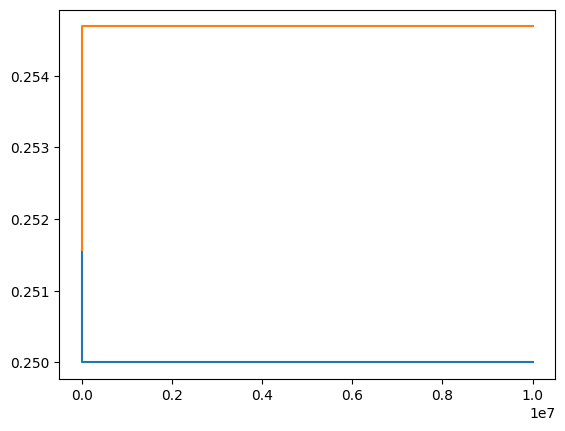

In [25]:
train_error = []
val_error = []
for c in C_range:
    clf = SVC(C=c, kernel='linear',max_iter=1000)
    train_score = 0
    val_score = 0
    for train_index, val_index in kf.split(features_train, labels_train.ravel()):
        X_train, X_val = features_train[train_index], features_train[val_index]
        Y_train, Y_val = labels_train[train_index], labels_train[val_index]
        clf.fit(X_train, Y_train.ravel())
        train_score = train_score + clf.score(X_train, Y_train.ravel())
        # print log_loss(Y_train.ravel(),clf.predict(X_train)),'train'
        val_score = val_score + clf.score(X_val, Y_val.ravel())

    train_error = train_error + [1 - (train_score / 4)]
    val_error = val_error + [1 - (val_score / 4)]

print (train_error, 'linear')
print (val_error, 'linear')

plt.plot(C_range, train_error, label='linear')
plt.plot(C_range, val_error)
plt.show()


In [26]:
### RBF Kernel

param_grid = dict(gamma=gamma_range, C=C_range,max_iter=[10])

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
grid.fit(features_train,labels_train.ravel())
print (grid.best_estimator_)
print (grid.score(features_train,labels_train.ravel()),'train score')
print (grid.score(features_test,labels_test.ravel()),'test score')

score_dict = grid.cv_results_



C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Py

SVC(C=0.001, gamma=1e-05, max_iter=10)
0.9979166666666667 train score
0.9916666666666667 test score


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Py

In [ ]:
# We extract just the scores
scores = [x[1] for x in score_dict]
scores = np.array(scores).reshape
plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=0.15, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores)
plt.xlabel('gamma')
plt.ylabel('C')
plt.colorbar()
plt.xticks(np.arange(len(gamma_range)), gamma_range, rotation=45)
plt.yticks(np.arange(len(C_range)), C_range)
plt.show()

multi class classification

In [28]:
data=pd.read_csv('feat_25.csv',header=None)
data = data.reindex(np.random.permutation(data.index))
#print data2

train, test = np.split(data.sample(frac=1), [int(.8 * len(data))])

features_train = np.array(train.iloc[:,:25])
labels_train = np.array(train.iloc[:, 25:])

features_test = np.array(test.iloc[:, :25])
labels_test = np.array(test.iloc[:,25:])
kf = StratifiedKFold(n_splits=3)
C_range = 2. ** np.arange(-8, 8)
gamma_range = 2. ** np.arange(-25, -15)
degree_range = np.arange(1,20)

coef0_range =np.arange(-2,2)

1
2
3
4
5


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


6


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


7


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundat

8


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


9


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundat

10


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


11


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


12


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


13


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundat

14


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


15


C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=2000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


16
[0.34640625, 0.33421875, 0.326875, 0.3209375, 0.31375, 0.30828125000000006, 0.30359375, 0.29734375, 0.29093750000000007, 0.285625, 0.28234375, 0.28, 0.28218750000000004, 0.30874999999999997, 0.321875, 0.32140625] linear
[0.35875, 0.3506250000000001, 0.3415625, 0.3343750000000001, 0.33875, 0.339375, 0.34562500000000007, 0.35375, 0.3559375, 0.35624999999999996, 0.3578125, 0.35968749999999994, 0.36687499999999995, 0.38187499999999996, 0.389375, 0.38812500000000005] linear


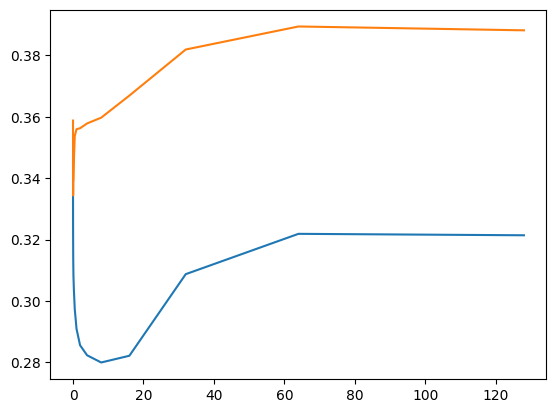

In [29]:
i=0

train_error = []
val_error = []
for c in C_range:
    clf = SVC(C=c, kernel='linear',max_iter=2000)
    train_score =0
    val_score=0
    for train_index, val_index in kf.split(features_train, labels_train.ravel()):
        X_train, X_val = features_train[train_index], features_train[val_index]
        Y_train, Y_val = labels_train[train_index], labels_train[val_index]

        clf.fit(X_train, Y_train.ravel())
        train_score = train_score + clf.score(X_train, Y_train.ravel())
        # print log_loss(Y_train.ravel(),clf.predict(X_train)),'train'
        val_score = val_score + clf.score(X_val, Y_val.ravel())

    i = i + 1
    print (i)

    train_error = train_error + [1 - (train_score / 4)]
    val_error = val_error + [1 - (val_score / 4)]

print (train_error,'linear')
print (val_error,'linear')


plt.plot(C_range,train_error,label='linear')
plt.plot(C_range,val_error)
plt.show()




In [30]:
###RBF kernel

param_grid = dict(gamma=gamma_range, C=C_range,max_iter= [10])

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
t0= time()
grid.fit(features_train,labels_train.ravel())
print ("fitting time",time()-t0)
print (grid.best_estimator_)
print (grid.score(features_train,labels_train.ravel()),'train score')
print (grid.score(features_test,labels_test.ravel()),'test score')

score_dict = grid.cv_results_



C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Py

fitting time 58.41362428665161
SVC(C=0.00390625, gamma=5.960464477539063e-08, max_iter=10)
0.5441666666666667 train score
0.56 test score


In [ ]:
# We extract just the scores
scores = [x[1] for x in score_dict]
scores = np.array(scores).reshape
plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=0.15, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest', cmap='jet')
plt.xlabel('gamma')
plt.ylabel('C')
plt.colorbar()
plt.xticks(np.arange(len(gamma_range)), gamma_range, rotation=45)
plt.yticks(np.arange(len(C_range)), C_range)
plt.show()

In [31]:
### Polynomial kernal

param_grid = dict(kernel =['poly'],gamma=gamma_range,coef0 =coef0_range, degree=degree_range, C=C_range,max_iter= [10])

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
t0 =time()
grid.fit(features_train,labels_train.ravel())

print ('###PolyKernal###')
print ("fitting time",time()-t0)


score_dict = grid.grid_scores_

# We extract just the scores
print (grid.best_estimator_)
print (grid.score(features_test,labels_test.ravel()),"score")
for x in score_dict:
    print (x)

print (grid.best_estimator_)
print (grid.score(features_train,labels_train.ravel()),'train score')
print (grid.score(features_test,labels_test.ravel()),'test score')

C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\acer\AppData\Local\Packages\PythonSoftwareFoundation.Py

In [ ]:
#WITH 10 features
image1 = data.iloc[0:300,:10]
labels1 = data.iloc[0:300,25:]

data1= pd.concat([image1,labels1],axis=1)

data1 = data1.reindex(np.random.permutation(data1.index))
#print data1

image2 = data.iloc[300:600,:10]
labels2 = data.iloc[300:600,25:]
data2= pd.concat([image2,labels2],axis=1)

data2 = data2.reindex(np.random.permutation(data2.index))
#print data2

train1, test1 = np.split(data1.sample(frac=1), [int(.8 * len(data1))])
train2, test2 = np.split(data2.sample(frac=1), [int(.8 * len(data2))])

train = pd.concat([train1,train2])
test = pd.concat([test1,test2])

features_train = np.array(train.iloc[:, :10])
labels_train = np.array(train.iloc[:,10:])

features_test = np.array(test.iloc[:, :10])
labels_test = np.array(test.iloc[:,10:])
print (features_train.shape,labels_train.shape)

In [ ]:


kf = StratifiedKFold(n_splits=3)

C_range = 10. ** np.arange(-1, 3)
gamma_range = 10. ** np.arange(-8, -3)
degree_range = np.arange(1,4)
coef0_range =np.arange(-17,-14)
# tuning C and degree
param_grid = dict(kernel = ['poly'],degree=degree_range, C=C_range,max_iter= [100],gamma= gamma_range,coef0= coef0_range)

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
grid.fit(features_train,labels_train.ravel())

print ('###PolyKernal###')


score_dict = grid.cv_results_
#print score_dict

for x in score_dict:
    print (x)
print (grid.best_estimator_)
print (grid.score(features_train,labels_train),'train score')
print (grid.score(features_test,labels_test.ravel()),"test score")



In [ ]:
kernel = ['linear']
l = 0
while l<len(kernel):
    train_error = []
    val_error = []

    for c in C_range:
        clf = SVC(C=c, kernel=kernel[l],max_iter=1000)
        train_score =0
        val_score=0

        for train_index, val_index in kf.split(features_train,labels_train.ravel()):
            X_train, X_val = features_train[train_index], features_train[val_index]
            Y_train, Y_val = labels_train[train_index], labels_train[val_index]
            clf.fit(X_train,Y_train.ravel())

            train_score = train_score+ clf.score(X_train,Y_train.ravel())
            #print log_loss(Y_train.ravel(),clf.predict(X_train)),'train'
            val_score = val_score + clf.score(X_val,Y_val.ravel())

        train_error = train_error +[1-(train_score/4)]
        val_error = val_error + [1-(val_score/4)]

    print (train_error,kernel[l])
    
    print (val_error,kernel[l])
    print ('test_accuracy', clf.score(features_test,labels_test.ravel()))
    plt.plot(C_range,train_error,label=kernel[l])
    plt.plot(C_range,val_error)
    plt.show()
    l=l+1

In [ ]:
param_grid = dict(gamma=gamma_range, C=C_range, max_iter= [1000])

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=StratifiedKFold(n_splits=3))
grid.fit(features_train,labels_train.ravel())

print (grid.best_estimator_)
print (grid.score(features_train,labels_train.ravel()),'train score')
print (grid.score(features_test,labels_test.ravel()),'test score')

score_dict = grid.cv_results_


In [ ]:
# We extract just the scores
scores = [x[1] for x in score_dict]
scores = np.array(scores).reshape(len(C_range), len(gamma_range))
pl.figure(figsize=(8, 6))
pl.subplots_adjust(left=0.15, right=0.95, bottom=0.15, top=0.95)
pl.imshow(scores, interpolation='nearest', cmap='jet')
pl.xlabel('gamma')
pl.ylabel('C')
pl.colorbar()
pl.xticks(np.arange(len(gamma_range)), gamma_range, rotation=45)
pl.yticks(np.arange(len(C_range)), C_range)
pl.show()
